# 第 10 章 差异表达与标记基因

## 学习目标

寻找支持细胞类型注释的差异表达基因，并正确理解比较对象和统计量。

## 为什么做与怎样做

在 log1p 表达数据上用 Wilcoxon 比较簇与其余细胞，并演示指定群体比较、表达比例过滤及多种图形。结果用于描述性标记探索。

前置章节：09。运行前请完成项目环境准备。


In [1]:
from __future__ import annotations
from pathlib import Path
import os
import sys
ROOT = Path(os.environ.get("SC_COURSE_ROOT", Path.cwd())).resolve()
while not (ROOT / "config/course.json").is_file() and ROOT != ROOT.parent:
    ROOT = ROOT.parent
if not (ROOT / "config/course.json").is_file():
    raise RuntimeError("请从课程目录或其 notebooks/exercises 目录运行。")
os.environ["CELLTYPIST_FOLDER"] = str(ROOT / ".runtime/celltypist")
os.environ["MPLCONFIGDIR"] = str(ROOT / ".runtime/matplotlib")
sys.path.insert(0, str(ROOT / "tools"))
from course_runtime import start_chapter, marker_sets, scaled_view
import anndata as ad
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
from scipy.sparse import csr_matrix
from scipy.stats import median_abs_deviation
ctx = start_chapter("10")
adata = ctx.load_input()


第 10 章：差异表达与标记基因
结果目录：results/10_differential_expression/20260915T075105_46d0d8


读取检查点：results/09_subclustering/20260915T074942_425323/checkpoint.h5ad
17,041 个细胞 × 23,427 个基因


## 10.1 以差异表达基因注释

In [2]:
# 功能说明：更新图形输出目录。
# 运行目的：将差异表达分析相关的图片保存到特定子文件夹。
# 详细代码解析：
# 1. `sc.settings.figdir = ...`
#    - 设置新的输出路径。

# 设置输出目录
sc.settings.figdir = ctx.figures

## 10.2 进行差异表达分析
还可以为每个簇计算差异表达基因，并根据这些基因是否对应已知的生物学（如细胞类型/状态）进行注释。常用的统计检验包括 Wilcoxon 与 t 检验，采用“该簇 vs 其余”的比较策略。
为了识别差异表达基因，我们运行 `sc.tl.rank_genes_groups`。此函数将获取每组细胞，并将组中每个基因的分布与不在该组中的所有其他细胞中的分布进行比较。

In [3]:
# 功能说明：执行差异表达分析（Differential Expression Analysis）。
# 运行目的：识别每个聚类（细胞类型）的特异性标记基因（Marker Genes），用于后续的生物学注释。
# 变量/函数/参数解析：
# - leiden_res = "leiden_res_0_50"：
#   - 定义要使用的聚类结果列名。
# - sc.tl.rank_genes_groups(...)：
#   - adata：AnnData 对象。
#   - groupby=leiden_res：指定分组变量，即按哪个聚类结果进行差异分析。
#   - method="wilcoxon"：
#     - 使用 Wilcoxon 秩和检验（非参数检验）。
#     - 相比 t 检验，它不假设数据服从正态分布，更适合单细胞数据的稀疏和偏态分布特性。
#   - key_added=leiden_res+"_rank_genes_groups"：
#     - 将分析结果存储在 adata.uns 中的指定键名下，避免覆盖默认的 'rank_genes_groups'。
#   - 默认行为：
#     - 对每个组进行 "One-vs-Rest"（该组 vs 其余所有组）比较。
#     - 计算 p 值、校正 p 值（benjamini-hochberg）、log2FC（对数倍数变化）等统计量。



# 4. 生物学意义：
#    - 识别每个聚类/细胞类型的特异性标记基因
#    - 用于细胞类型注释（找到每个细胞类型的特征基因）
#    - 发现不同条件下差异表达的基因

# 定义聚类分辨率变量
leiden_res = "leiden_res_0_50"
sc.tl.rank_genes_groups(
    adata,                    
    groupby=leiden_res, 
    method="wilcoxon", use_raw=False, layer="log1p",
    key_added=leiden_res+"_rank_genes_groups"
)

In [4]:
adata

AnnData object with n_obs × n_vars = 17041 × 23427
    obs: 'samples', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_res_0_02', 'leiden_res_0_50', 'leiden_res_1_00', 'leiden_res_2_00', 'cell_type_res_0.02_lvl1', 'cell_type_res_0.50_lvl1', 'cell_type_res_0.50_lvl2', 'leiden_sub'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'X_pca_bbknn', 'X_pca

## 10.3 使用UMAP可视化差异表达基因

=== 可视化 Cluster 0 的 top 5 差异基因 ===



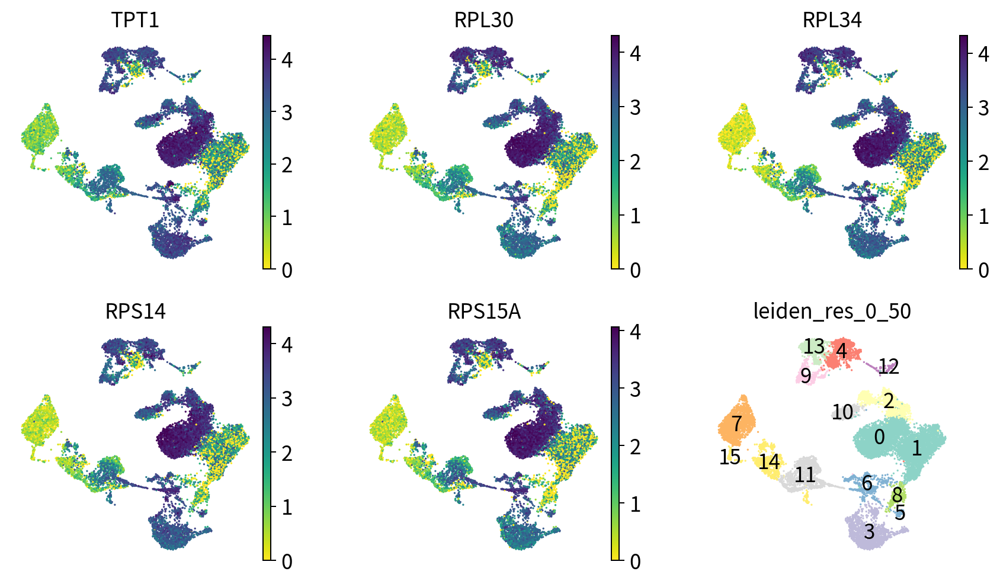

=== 可视化 Cluster 0 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 1 的 top 5 差异基因 ===



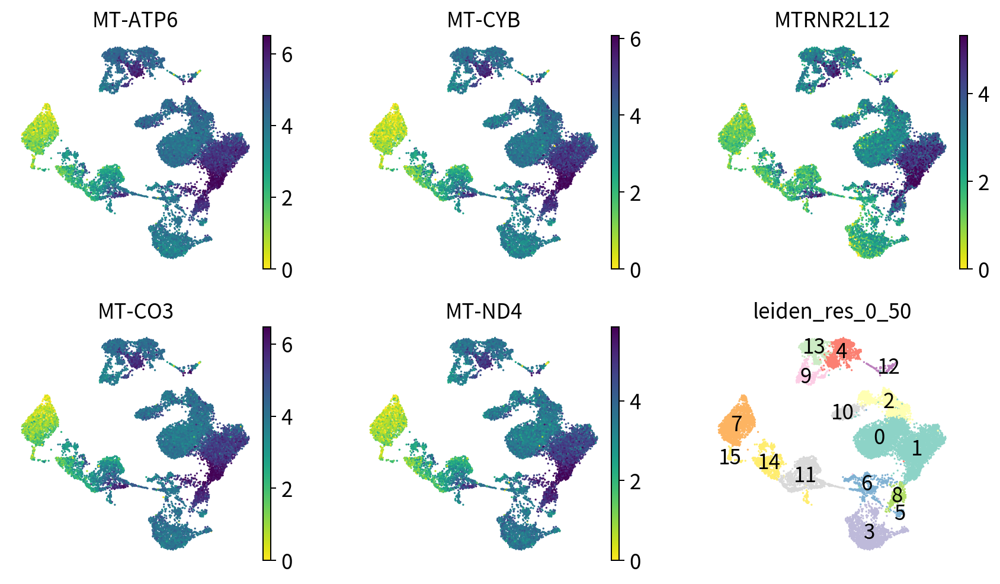

=== 可视化 Cluster 1 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 2 的 top 5 差异基因 ===



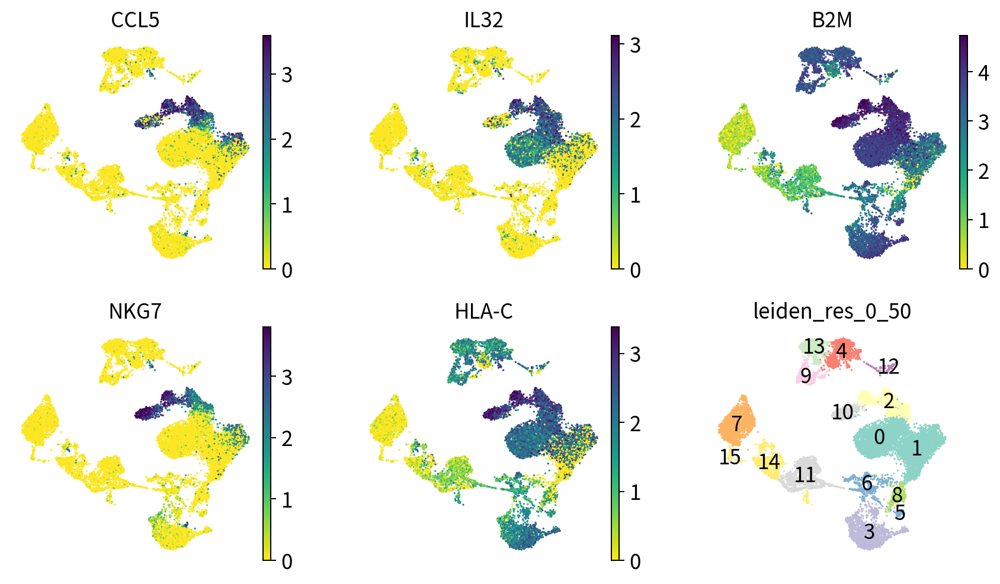

=== 可视化 Cluster 2 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 3 的 top 5 差异基因 ===



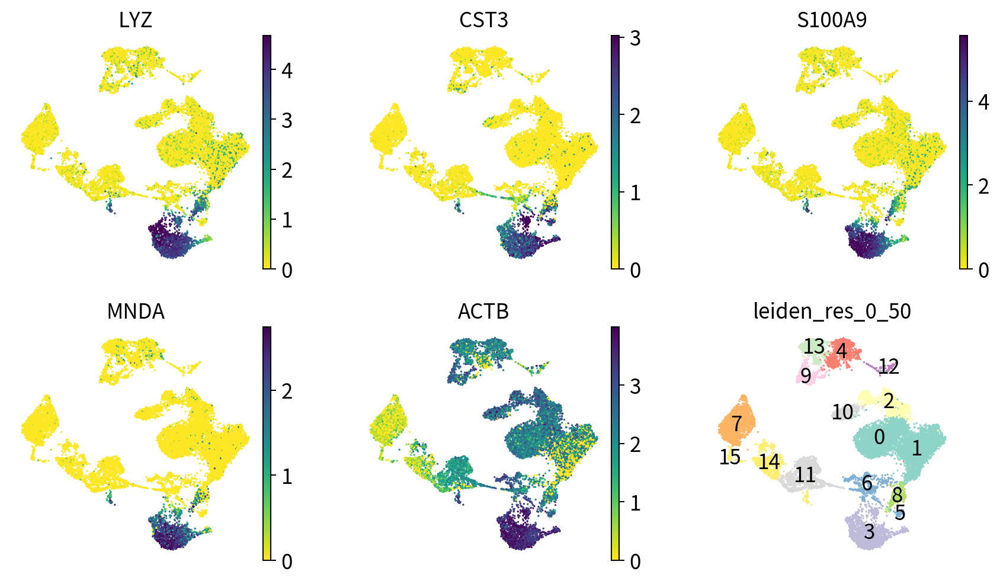

=== 可视化 Cluster 3 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 4 的 top 5 差异基因 ===



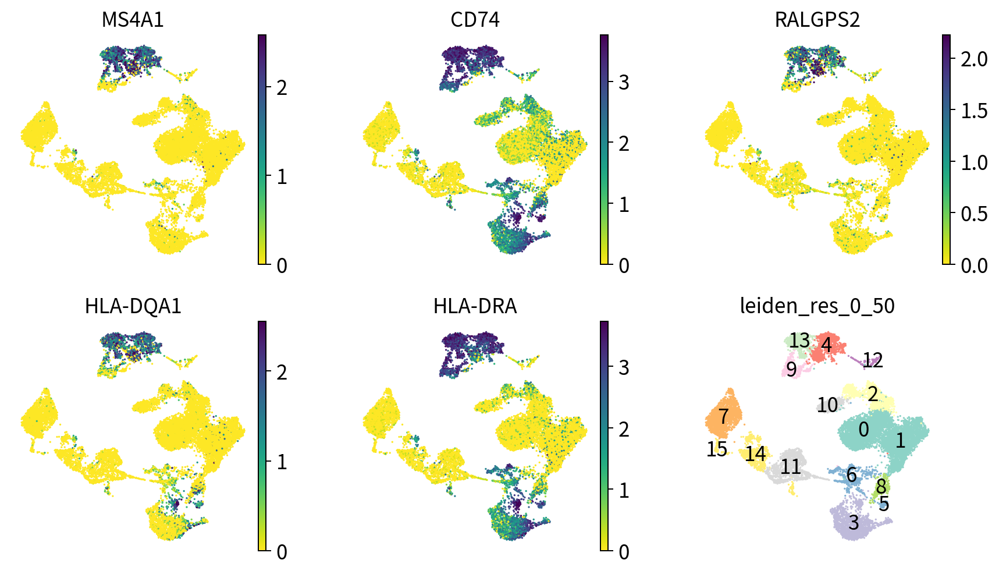

=== 可视化 Cluster 4 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 5 的 top 5 差异基因 ===



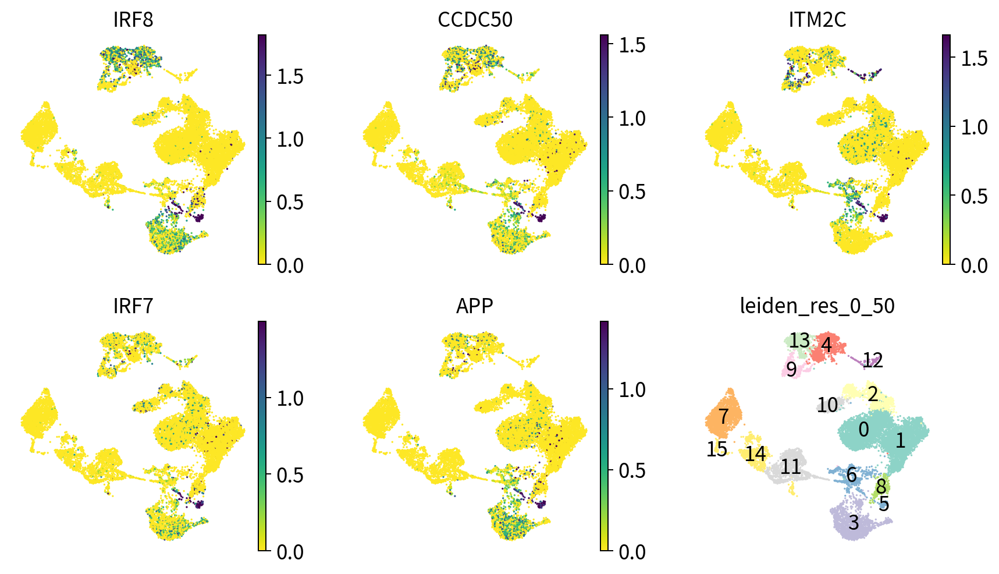

=== 可视化 Cluster 5 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 6 的 top 5 差异基因 ===



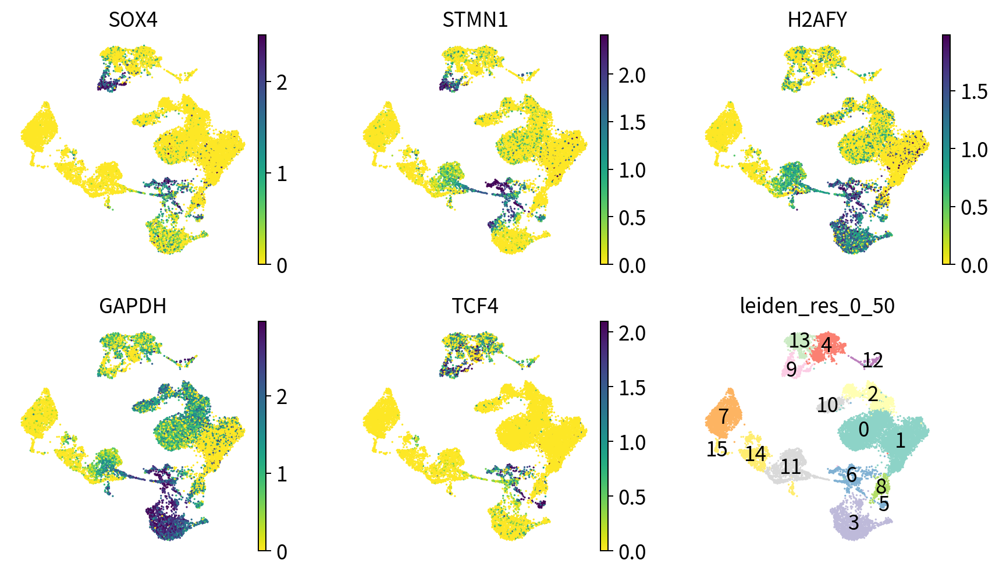

=== 可视化 Cluster 6 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 7 的 top 5 差异基因 ===



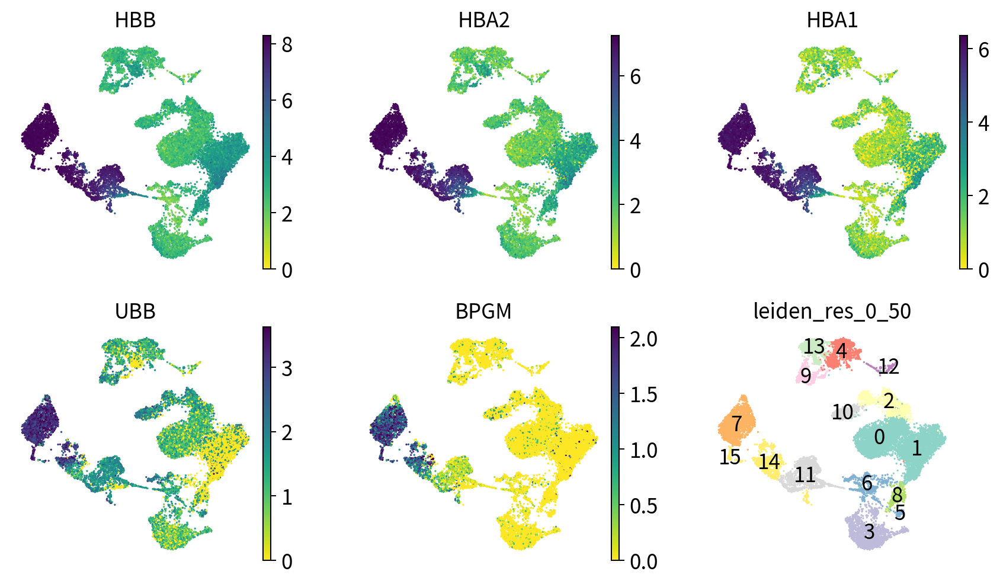

=== 可视化 Cluster 7 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 8 的 top 5 差异基因 ===



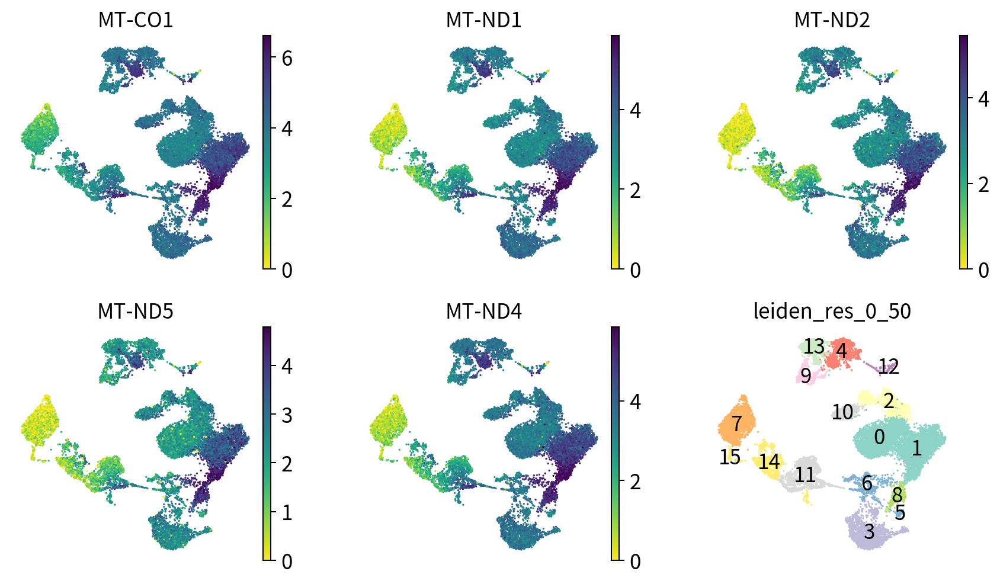

=== 可视化 Cluster 8 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 9 的 top 5 差异基因 ===



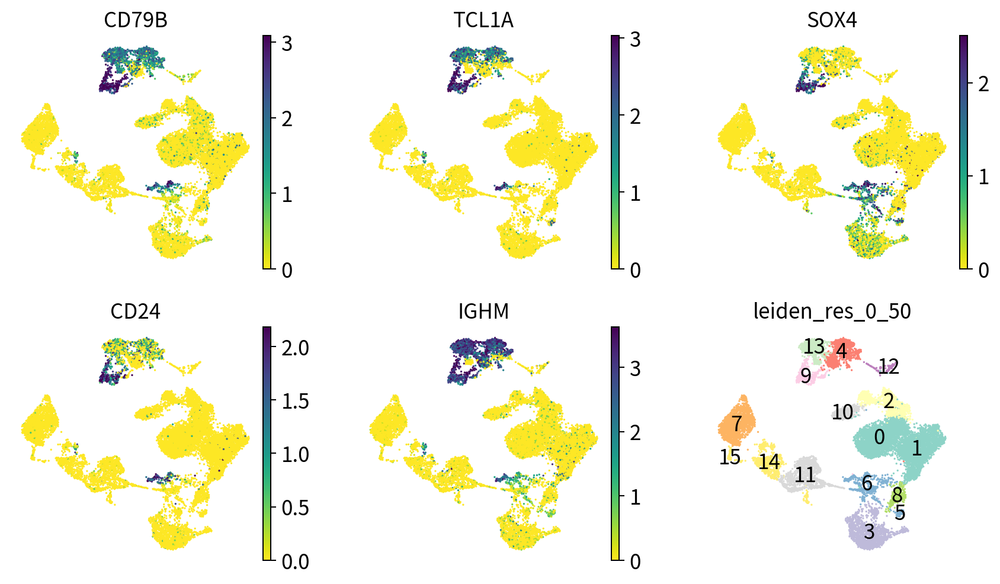

=== 可视化 Cluster 9 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 10 的 top 5 差异基因 ===



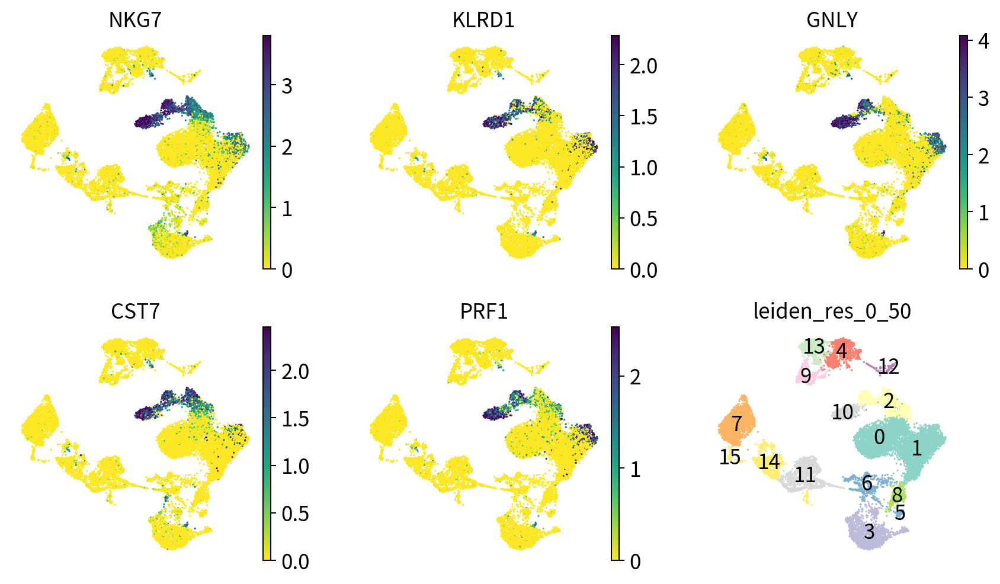

=== 可视化 Cluster 10 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 11 的 top 5 差异基因 ===



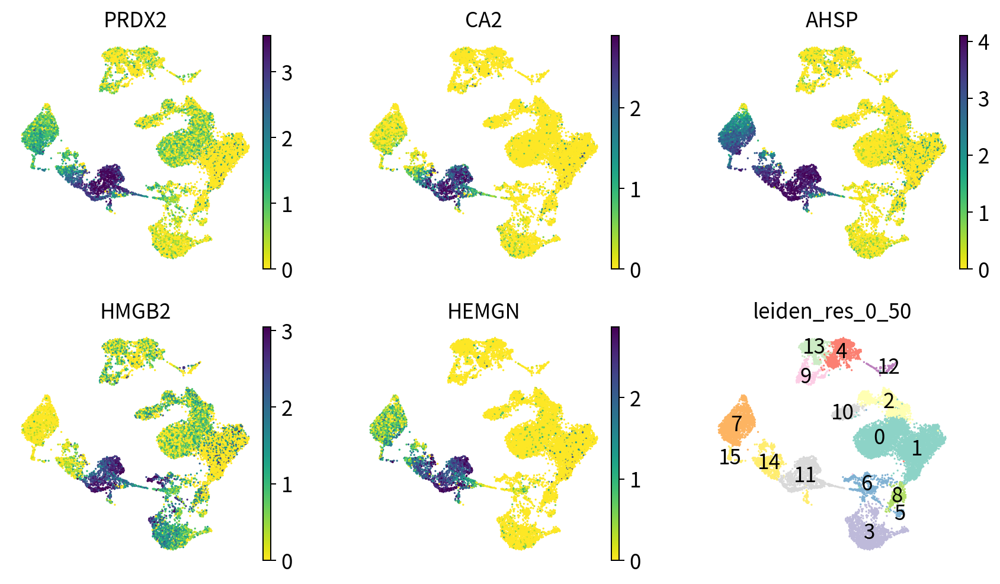

=== 可视化 Cluster 11 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 12 的 top 5 差异基因 ===



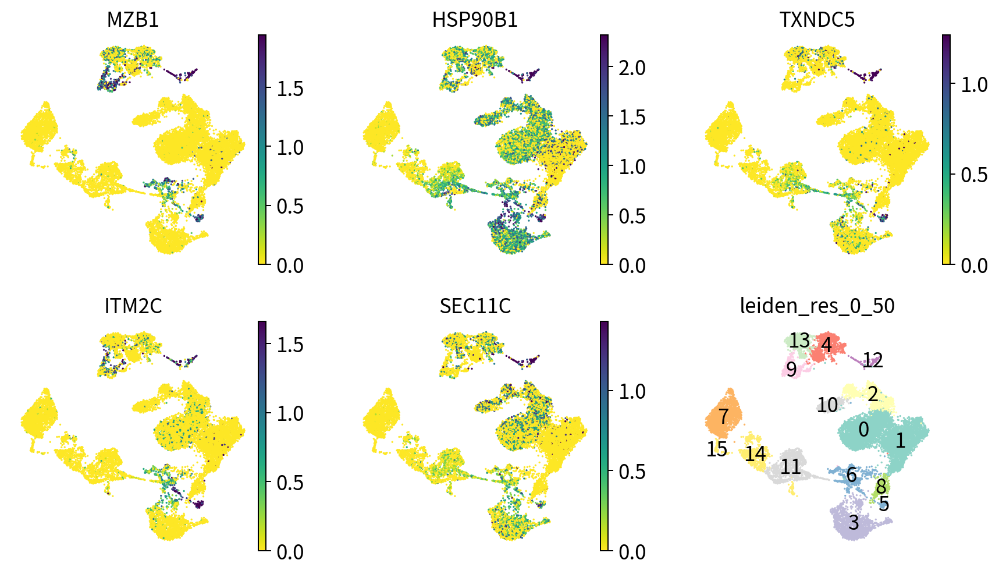

=== 可视化 Cluster 12 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 13 的 top 5 差异基因 ===



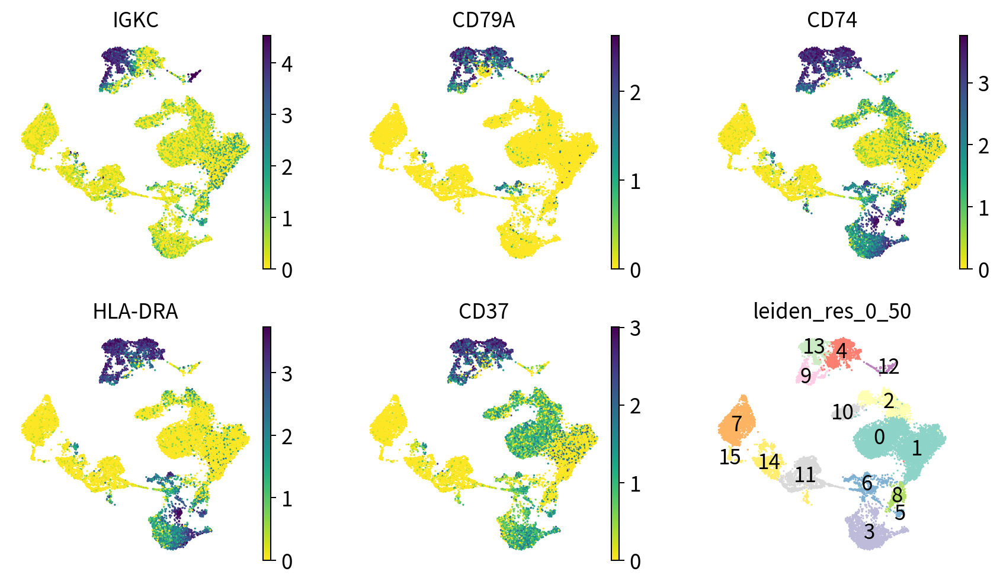

=== 可视化 Cluster 13 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 14 的 top 5 差异基因 ===



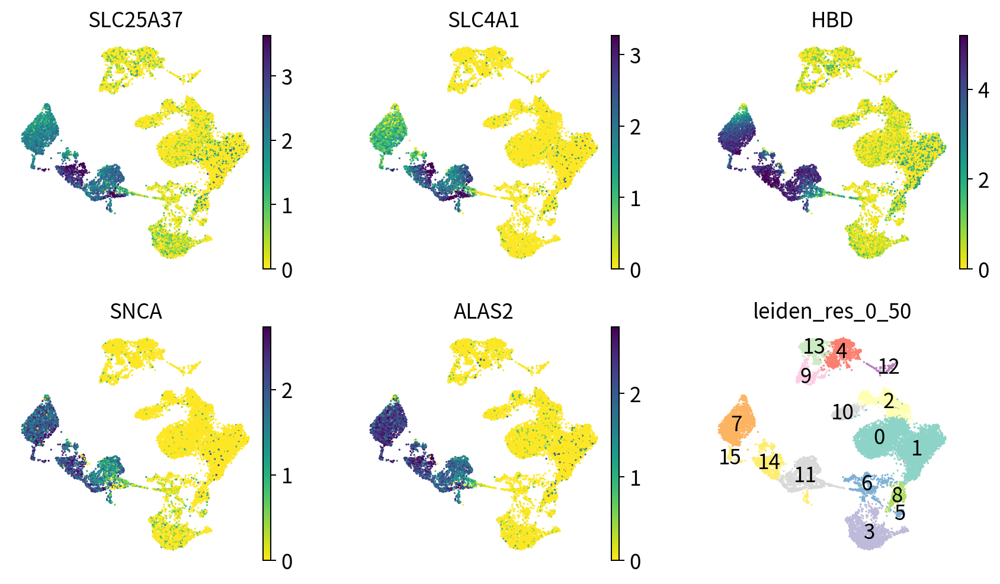

=== 可视化 Cluster 14 的 top 5 差异基因已完成 ===

=== 可视化 Cluster 15 的 top 5 差异基因 ===



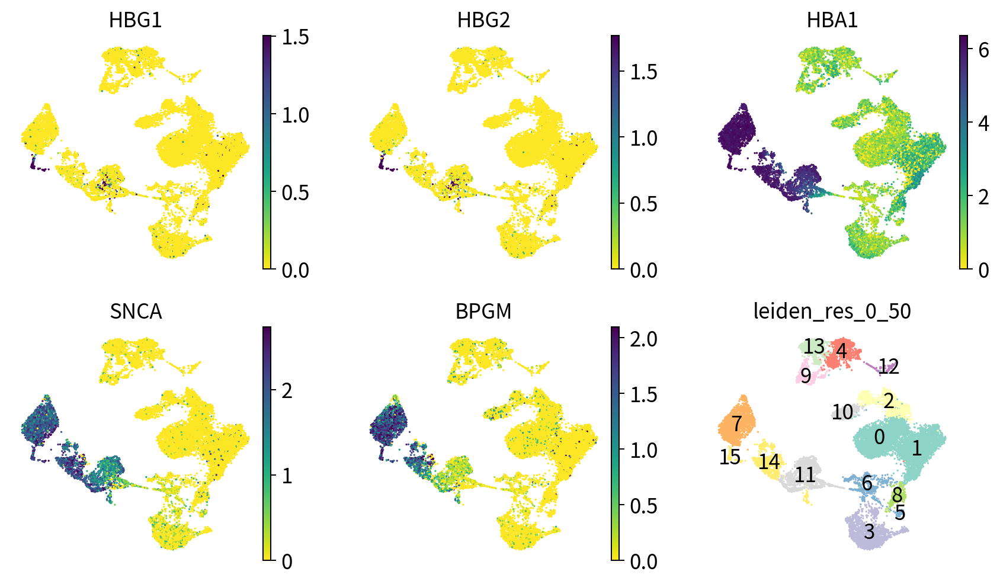

=== 可视化 Cluster 15 的 top 5 差异基因已完成 ===



In [5]:
# 功能说明：批量绘制每个簇的前 5 个差异基因的 UMAP 图。
# 运行目的：直观地验证差异基因在空间上的分布是否集中在对应的簇中。
# 详细代码解析：
# 1. 获取簇列表：
#    - `adata.obs[leiden_res].cat.categories.tolist()`: 获取所有聚类标签。
# 2. 循环遍历每个簇：
#    - `sc.get.rank_genes_groups_df(...)`:
#      - 获取指定簇的差异基因列表。
#      - `group=cluster_num`: 指定当前簇。
#      - `key=...`: 指定差异分析结果的存储键。
#      - `.head(5)["names"].tolist()`: 提取前 5 个基因的名称。
# 3. `sc.pl.umap(...)`:
#    - `color=dc_cluster_genes + [leiden_res]`: 同时展示 5 个基因的表达量和聚类图。
#    - `vmin=0, vmax="p99"`: 设置颜色映射范围，去除极端值影响。
#    - `ncols=3`: 每行显示 3 个子图。

# 首先，获取所有需要遍历的簇标签列表
with rc_context({"figure.figsize": (3, 3)}):
    all_clusters = adata.obs[leiden_res].cat.categories.tolist()
    for cluster_num in all_clusters:
        print(f"=== 可视化 Cluster {cluster_num} 的 top 5 差异基因 ===\n")
        
        # 关键修改：在循环内，动态获取当前簇的差异基因
        dc_cluster_genes = sc.get.rank_genes_groups_df(
            adata,
            group=cluster_num,  # 动态设为当前簇的编号
            key=leiden_res+"_rank_genes_groups"
        ).head(5)["names"].tolist()  # 转为列表
        # 可视化：在当前簇的差异基因外，同时着色细胞簇本身
        sc.pl.umap(
            adata,
            color=dc_cluster_genes + [leiden_res],  # 合并基因列表和分组标签
            legend_loc="on data",
            vmin=0,
            vmax="p99",
            sort_order=False,
            frameon=False,
            ncols=3,  # 每行显示3张小图
            # cmap="Reds",
            save=f"_10_234_{cluster_num}.pdf"
        )
        
        print(f"=== 可视化 Cluster {cluster_num} 的 top 5 差异基因已完成 ===\n")

## 10.4 使用点图可视化差异表达基因
我们可以在点图上可视化每个簇的前 5 个差异表达基因。

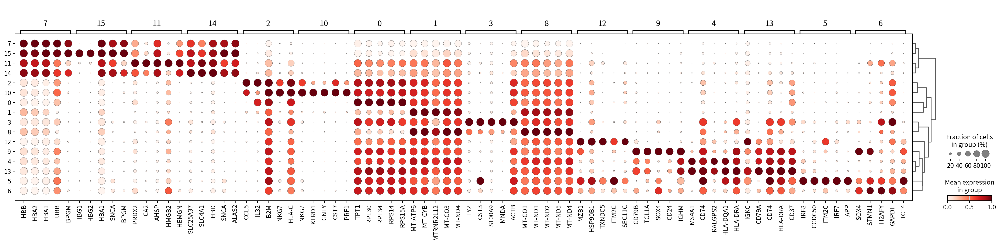

In [6]:
# 绘制差异表达基因点图（Dot Plot）
# 功能解释：
# 1. 可视化内容：
#    - 每个聚类的特异性标记基因
#    - 点的大小表示该基因在聚类中的表达比例（表达该基因的细胞百分比）
#    - 点的颜色表示该基因在聚类中的平均表达量（已标准化）
# 2. 图形解读：
#    - X轴：不同的细胞聚类（leiden_res_0_50）
#    - Y轴：差异表达基因
#    - 点大小：表达比例（越大表示越多的细胞表达该基因）
#    - 点颜色：标准化后的表达量（红色表示高表达，蓝色表示低表达）
# 3. 参数说明：
#    - groupby: 必须与rank_genes_groups中使用的分组一致
#    - standard_scale: 标准化方式，可选：
#        * "var": 按基因标准化（每行/每个基因），# 将每个基因在所有聚类中的表达值缩放到0-1范围，# 便于比较基因在不同聚类中的相对表达水平
#        * "group": 按分组标准化（每列/每个聚类）
#        * None: 不标准化，使用原始表达值
#    - n_genes: 每个聚类展示的基因数
#    - 其他可选参数：
#        * gene_symbols: 使用基因符号而非ID
#        * values_to_plot: 展示哪种值（默认是log fold change）
#        * cmap: 颜色映射
#        * min_logfoldchange: 最小log2倍数变化阈值
#        * key: 指定存储差异分析结果的键名,指定从哪里读取差异分析的结果（对应之前 `key_added` 的值）。
# 4. 生物学应用：
#    - 快速识别每个细胞类型的特征标记基因
#    - 比较不同聚类之间标记基因的表达模式
#    - 验证细胞类型注释的正确性
#    - 发现共表达的基因模块
# 5. 注意事项：
#    - 必须先执行sc.tl.rank_genes_groups才能绘制此图
#    - 图形可能较复杂，可以通过调整参数优化显示效果
sc.pl.rank_genes_groups_dotplot(adata, 
                                groupby=leiden_res, 
                                standard_scale="var", 
                                n_genes=5, 
                                key=leiden_res+"_rank_genes_groups",
                                save="_10_236.pdf")

我们可以使用这些基因来推断各簇对应的细胞类型。例如，第 7 簇表达 [NKG7](https://www.genecards.org/cgi-bin/carddisp.pl?gene=NKG7&keywords=nkg7) 与 [GNLY](https://www.genecards.org/cgi-bin/carddisp.pl?gene=GNLY&keywords=GNLY)，提示其可能为 [自然杀伤细胞（NK）](https://zh.wikipedia.org/wiki/%E8%87%AA%E7%84%B6%E6%9D%80%E4%BC%A4%E7%BB%86%E8%83%9E)。

如上图所示，许多差异表达基因在多个簇中高表达。我们可以过滤差异表达基因，以选择更具簇特异性的差异表达基因：

In [7]:
adata_filtered = adata

In [8]:
# 检查两个变量是否指向同一对象
print(adata_filtered is adata)  # True 表示是同一对象
# 检查内存地址
print(id(adata_filtered) == id(adata))  # True 表示相同地址

True
True


In [9]:
adata_filtered = adata.copy()

In [10]:
# 检查两个变量是否指向同一对象
print(adata_filtered is adata)  # True 表示是同一对象
# 检查内存地址
print(id(adata_filtered) == id(adata))  # True 表示相同地址

False
False


In [11]:
print(type(adata))

<class 'anndata._core.anndata.AnnData'>


In [12]:
print(type(adata_filtered))

<class 'anndata._core.anndata.AnnData'>


In [13]:
# 功能说明：过滤差异表达基因，筛选出更具特异性的标记。
# 运行目的：去除那些在很多簇中都表达的基因，只保留在目标簇中高表达且在其他簇中低表达的基因。
# 详细代码解析：
# 1. `sc.tl.filter_rank_genes_groups(...)`
#    - `sc.tl.filter_rank_genes_groups`: 过滤差异基因的函数。
#    - `adata`: 数据对象。
#    - `min_in_group_fraction=0.2`: 筛选条件1。基因在目标簇内的表达比例至少要达到 20%。
#    - `max_out_group_fraction=0.2`: 筛选条件2。基因在目标簇之外（其他所有簇）的表达比例不能超过 20%。
#    - `key="dea_leiden_2"`: 输入的差异分析结果键名。
#    - `key_added=leiden_res+"_rank_genes_groups"+"_filtered"`: 将过滤后的结果存储在新的键名下。

sc.tl.filter_rank_genes_groups(
    adata_filtered,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key=leiden_res+"_rank_genes_groups",
    key_added=leiden_res+"_rank_genes_groups"+"_filtered",
)

In [14]:
leiden_res+"_rank_genes_groups"

'leiden_res_0_50_rank_genes_groups'

In [15]:
adata

AnnData object with n_obs × n_vars = 17041 × 23427
    obs: 'samples', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_res_0_02', 'leiden_res_0_50', 'leiden_res_1_00', 'leiden_res_2_00', 'cell_type_res_0.02_lvl1', 'cell_type_res_0.50_lvl1', 'cell_type_res_0.50_lvl2', 'leiden_sub'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'X_pca_bbknn', 'X_pca

可视化过滤后的基因：

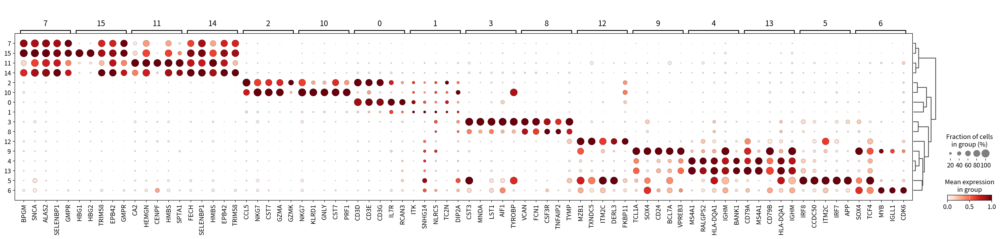

In [16]:
# 功能说明：绘制过滤后的差异基因点图。
# 运行目的：展示经过特异性筛选后的标记基因，验证过滤效果。
# 详细代码解析：
# 1. `sc.pl.rank_genes_groups_dotplot(...)`
#    - `key=...+"_filtered"`: 使用过滤后的差异分析结果。
#    - 其他参数同上。

sc.pl.rank_genes_groups_dotplot(
    adata_filtered,
    groupby=leiden_res,
    standard_scale="var",
    n_genes=5,
    key=leiden_res+"_rank_genes_groups"+"_filtered",
    save="_10_249.pdf"
)

为了获得更好的表示，我们可以绘制 对数倍数变化 (log fold changes) 而不是基因表达量。此外，我们要关注在细胞类型表达与其他细胞之间对数倍数变化 >= 3 的基因。

在这种情况下，我们设置 values_to_plot='logfoldchanges' 和 min_logfoldchange=3。

因为对数倍数变化是一个发散的尺度，我们也调整了要绘制的最小值和最大值，并使用了发散色图。


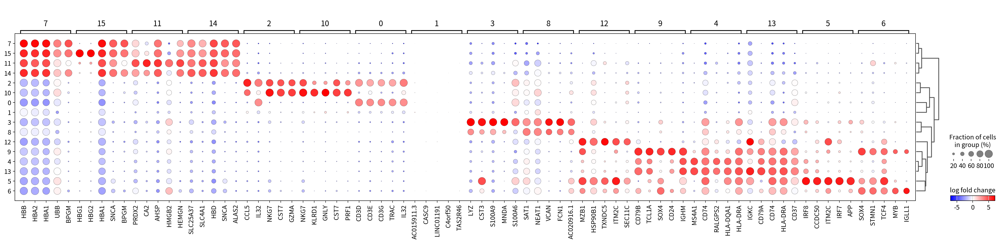

In [17]:
# 功能说明：绘制基于对数倍数变化（Log Fold Change）的点图。
# 运行目的：展示基因表达变化的幅度（Fold Change），而不仅仅是表达量。这有助于识别表达量虽然不高但差异倍数很大的基因。
# 变量/函数/参数解析：
# - values_to_plot="logfoldchanges"：
#   - 绘制的值是对数倍数变化（Log2FC）。
#   - 正值表示上调，负值表示下调。
# - min_logfoldchange=3：
#   - 仅显示 LogFC 绝对值 >= 3 的基因。
#   - 这是一个严格的阈值，只保留差异非常显著的基因。
# - vmax=7, vmin=-7：
#   - 设置颜色映射的范围为 [-7, 7]。
#   - 保证颜色标尺的对称性，便于观察上调和下调。
# - cmap="bwr"：
#   - 使用 "Blue-White-Red" 色图。
#   - 蓝色=下调，白色=无变化，红色=上调。

sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=5,
    values_to_plot="logfoldchanges",
    min_logfoldchange=3,
    vmax=7,
    vmin=-7,
    cmap="bwr",
    key=leiden_res+"_rank_genes_groups",
    save="_10_251.pdf"
)

标记基因需要组合解释。例如 NKG7 和 GNLY 的表达可提示细胞具有细胞毒性相关特征，但仍需结合其他标记与群体背景区分 NK 和部分 T 细胞。请以本次图表定位相应的簇。

## 10.5 聚焦特定聚类

使用 groups 参数选择两个聚类，并通过 min_logfoldchange 关注效应较大的基因。下面最多展示每组 5 个基因；聚类编号的生物学含义以本次注释为准。

categories: 0, 1, 2, etc.
var_group_labels: 2, 11


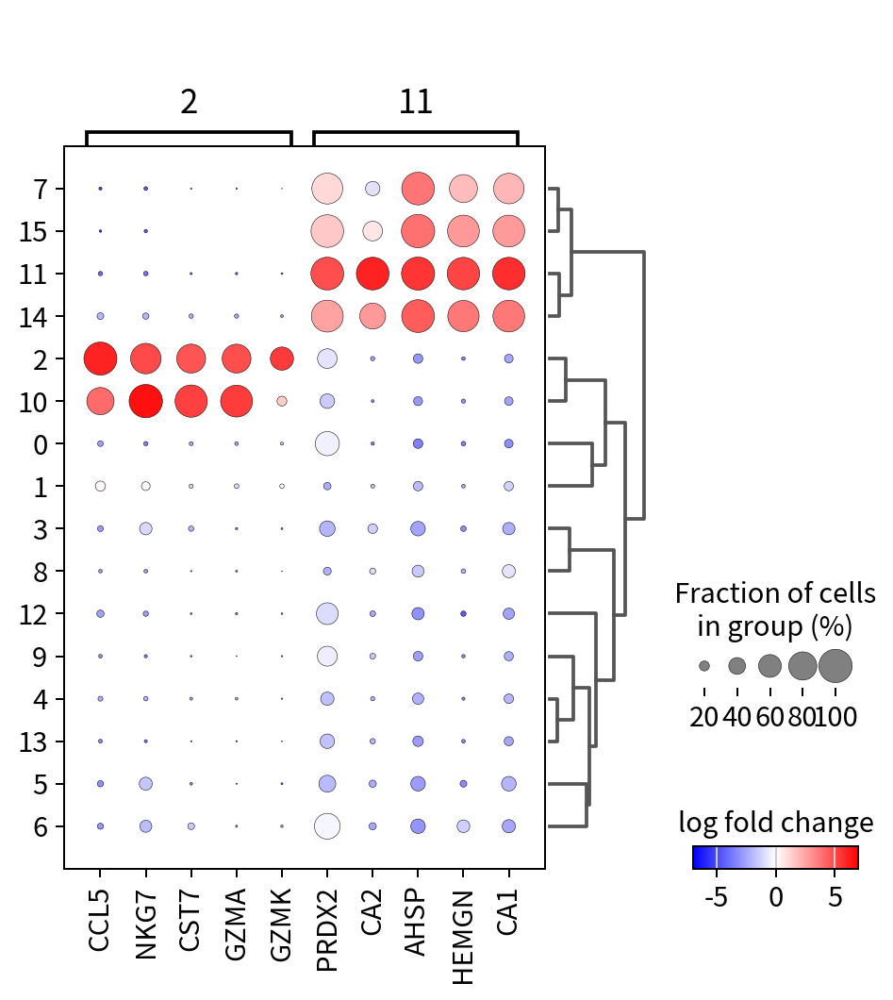

In [18]:
# 功能说明：绘制特定簇（Cluster 2 和 11）的差异基因点图（LogFC）。
# 运行目的：深入比较特定两个感兴趣的簇，查看它们各自的特异性上调基因。
# 变量/函数/参数解析：
# - groups=["2", "11"]：
#   - 仅展示聚类 "2" 和 "11" 的结果。
# - n_genes=5：
#   - 每个簇显示前 5 个基因。
# - min_logfoldchange=4：
#   - 提高阈值到 4，筛选差异更显著的基因。

sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=5,
    values_to_plot="logfoldchanges",
    min_logfoldchange=4,
    vmax=7,
    vmin=-7,
    cmap="bwr",
    groups=["2", "11"],
    key=leiden_res+"_rank_genes_groups",
    save="_10_254.pdf"  
)

categories: 0, 1, 2, etc.
var_group_labels: 2, 11


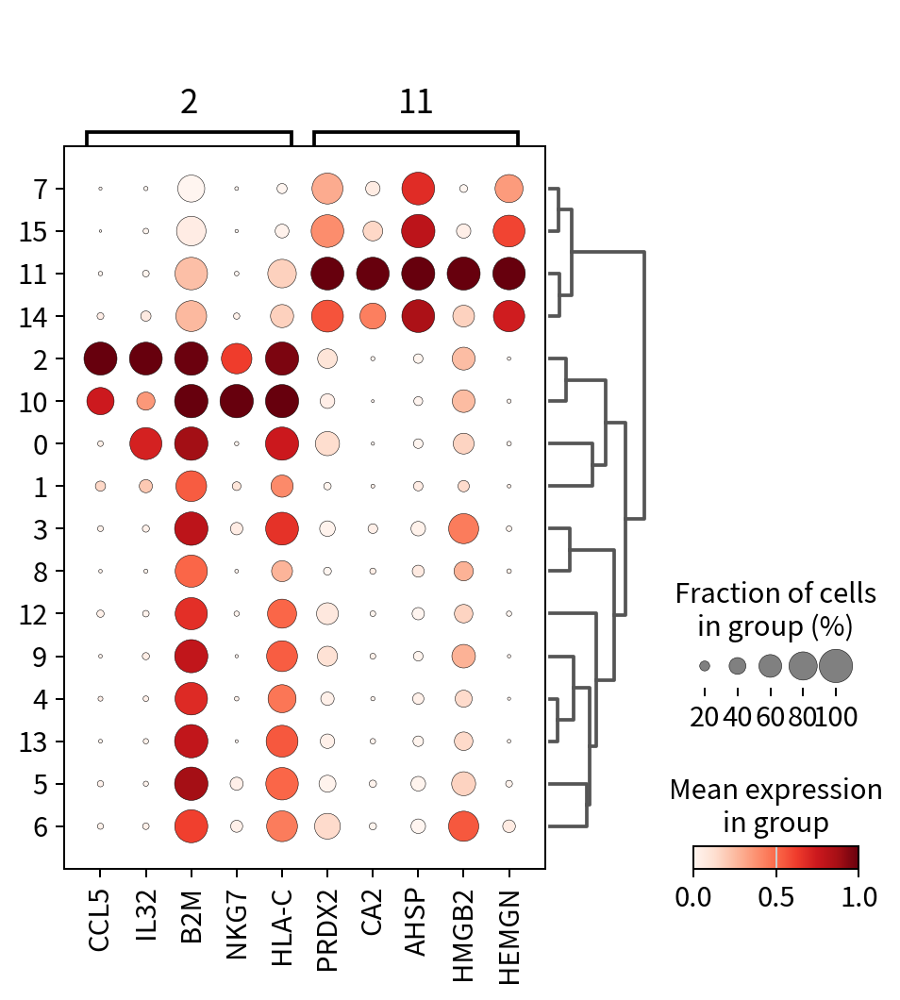

In [19]:
# 功能说明：绘制特定簇（Cluster 2 和 11）的差异基因点图（标准化表达量）。
# 运行目的：查看这两个簇标记基因的实际表达水平（标准化后）。
# 变量/函数/参数解析：
# - standard_scale="var"：
#   - 按基因标准化，展示相对表达高低。

sc.pl.rank_genes_groups_dotplot(adata, 
                                standard_scale="var", 
                                n_genes=5, 
                                groups=["2", "11"],
                                key=leiden_res+"_rank_genes_groups",
                                save="_10_255.pdf"
                        )

## 10.6 矩阵图与缩放表达

对本次展示的基因构造绘图副本，并将 z-score 保存到该副本的 scaled 层。主对象的 log1p 表达保持不变。

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


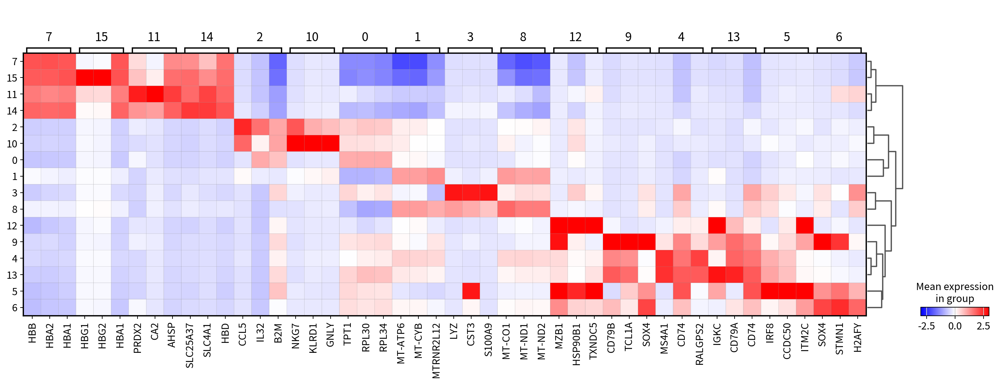

In [20]:
ranked_genes = sc.get.rank_genes_groups_df(adata, group=None, key=leiden_res + "_rank_genes_groups")
plot_genes = ranked_genes.groupby("group", observed=True).head(3)["names"].tolist()
adata_scaled = scaled_view(adata, plot_genes)
# 功能说明：使用矩阵图（Matrix Plot）展示差异表达基因。
# 运行目的：以热图形式展示每个聚类的前 3 个标记基因的平均表达量。矩阵图类似于热图，但通常用于展示分组后的平均值。
# 变量/函数/参数解析：
# - sc.pl.rank_genes_groups_matrixplot(...)：
#   - n_genes=3：每个聚类显示前 3 个基因。
#   - use_raw=False：使用处理后的数据（adata.X 或 layers）。
#   - layer="scaled"：
#     - 使用之前计算并存储在 layers 中的 "scaled" 数据（Z-score 标准化数据）。
#     - 这对于热图类可视化很重要，可以突出相对差异。
#   - vmin=-3, vmax=3：设置颜色映射范围。

sc.pl.rank_genes_groups_matrixplot(adata_scaled, n_genes=3, use_raw=False, vmin=-3, vmax=3, cmap="bwr", layer="scaled",key=leiden_res+"_rank_genes_groups",save="_10_257.pdf")

## 10.7 使用堆叠小提琴图可视化差异表达基因

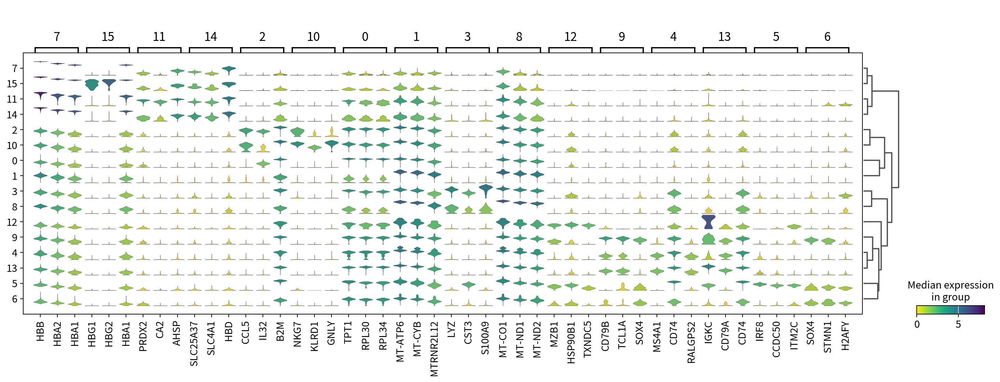

In [21]:
# 功能说明：使用堆叠小提琴图（Stacked Violin Plot）展示差异表达基因。
# 运行目的：同时展示基因表达的分布（小提琴图的形状）和强度。相比点图，它能提供更丰富的分布信息。
# 变量/函数/参数解析：
# - sc.pl.rank_genes_groups_stacked_violin(...)：
#   - n_genes=3：每个聚类显示前 3 个基因。
#   - cmap="viridis_r"：
#     - 使用 "viridis_r"（反转的 viridis）色图。
#     - 通常用于表示表达密度或强度。

sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=3, cmap="viridis_r",key=leiden_res+"_rank_genes_groups",save="_10_259.pdf")

## 10.8 使用热图可视化差异表达基因

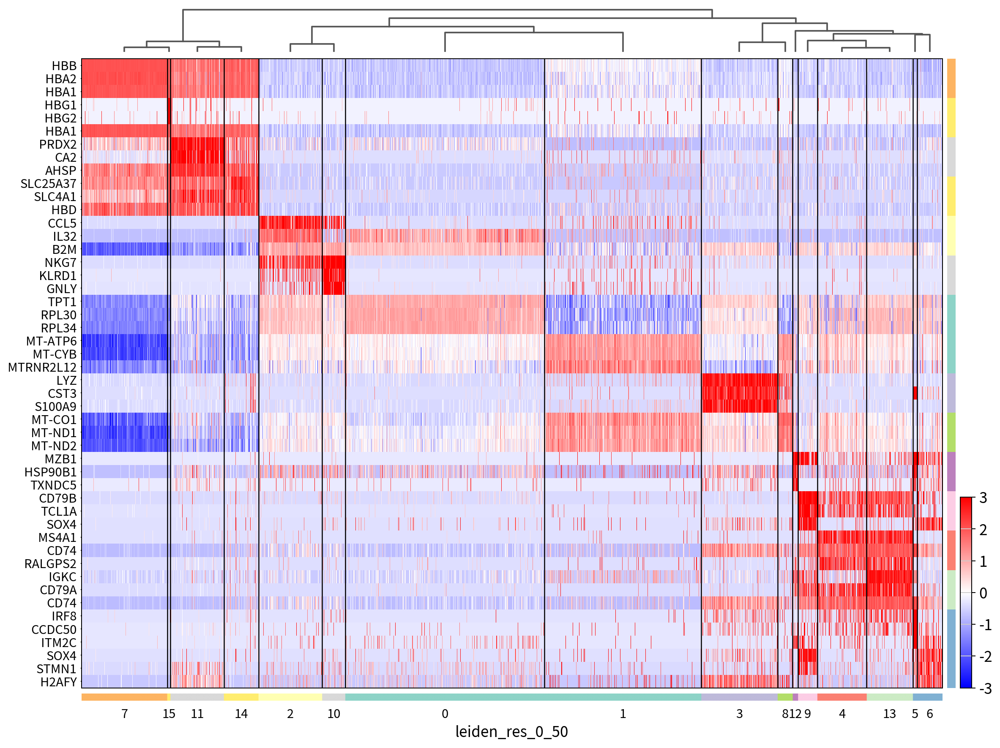

In [22]:
# 功能说明：使用热图（Heatmap）展示差异表达基因。
# 运行目的：以单细胞分辨率（或抽样后的单细胞）展示每个聚类的前 3 个标记基因的表达情况。
# 变量/函数/参数解析：
# - sc.pl.rank_genes_groups_heatmap(...)：
#   - n_genes=3：每个聚类显示前 3 个基因。
#   - swap_axes=True：
#     - 交换 X 轴和 Y 轴。
#     - 结果：行是基因，列是细胞（按聚类排序）。
#   - show_gene_labels=True：显示基因名称。
#   - layer="scaled"：使用标准化数据。
#   - figsize=(15, 12)：设置较大的图形尺寸以容纳标签。

sc.pl.rank_genes_groups_heatmap(
    adata_scaled,
    n_genes=3,
    use_raw=False,
    swap_axes=True,
    vmin=-3,
    vmax=3,
    cmap="bwr",
    layer="scaled",
    figsize=(15, 12),
    show_gene_labels=True,
    key=leiden_res+"_rank_genes_groups",
    #show=False,
    save="_10_261.pdf"
)

下面关闭基因标签并交换坐标轴，以观察整体模式；具体展示数量以 n_genes 参数为准。

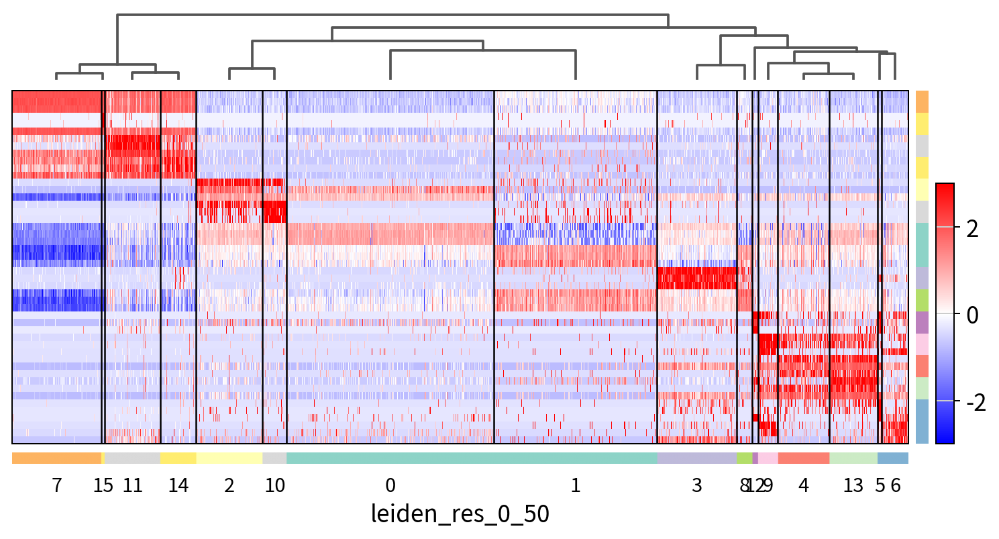

In [23]:
# 功能说明：绘制更紧凑的热图（不显示基因名）。
# 运行目的：展示更多基因（每个聚类 3 个）的整体表达模式，忽略具体的基因名称，关注聚类间的整体差异模式。
# 变量/函数/参数解析：
# - n_genes=3：每个聚类显示前 10 个基因。
# - show_gene_labels=False：
#   - 隐藏基因名称。
#   - 当展示大量基因时，标签会重叠且难以阅读，隐藏后可以更清晰地看到色块模式。

sc.pl.rank_genes_groups_heatmap(
    adata_scaled,
    n_genes=3,
    use_raw=False,
    swap_axes=True,
    show_gene_labels=False,
    vmin=-3,
    vmax=3,
    cmap="bwr",
    layer="scaled",
    key=leiden_res+"_rank_genes_groups",
    save="_10_263.pdf"
)

## 10.9 使用分割小提琴图比较标记基因

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


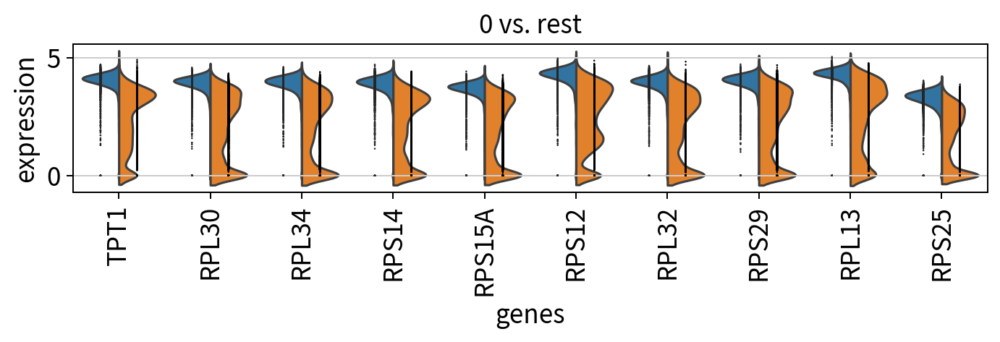

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


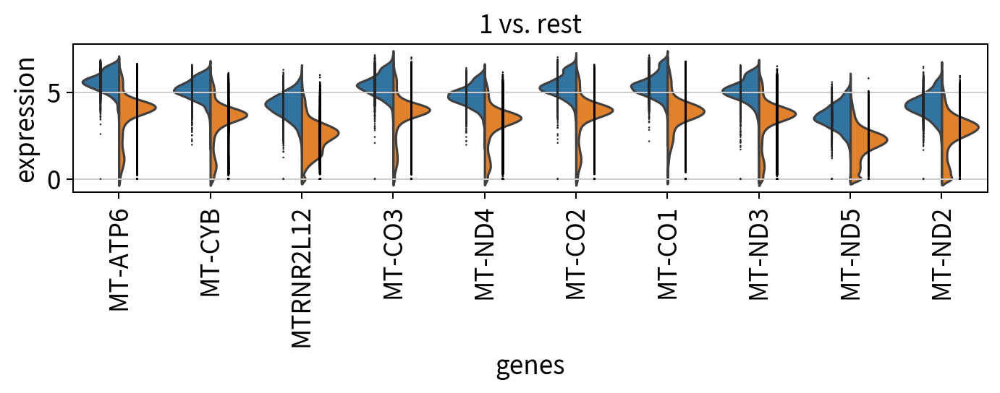

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


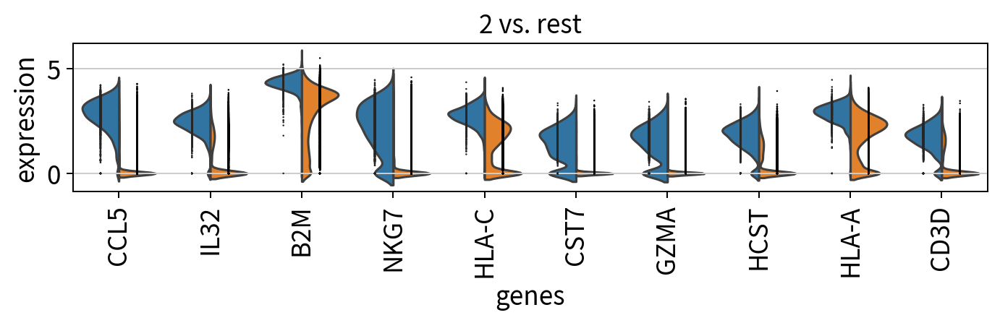

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


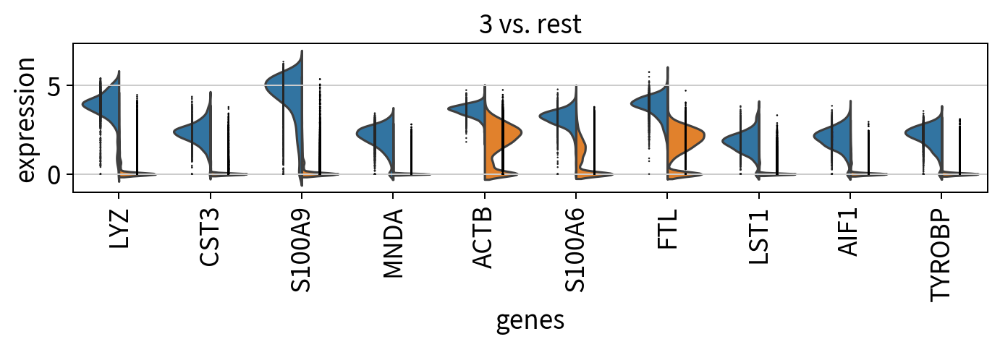

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


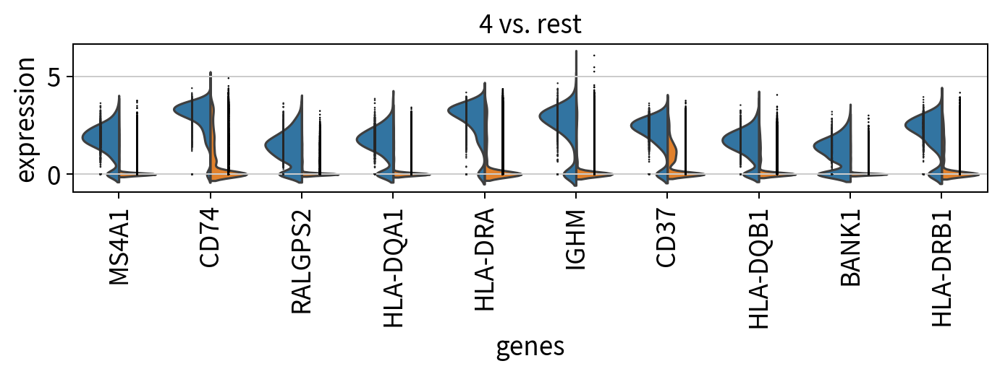

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


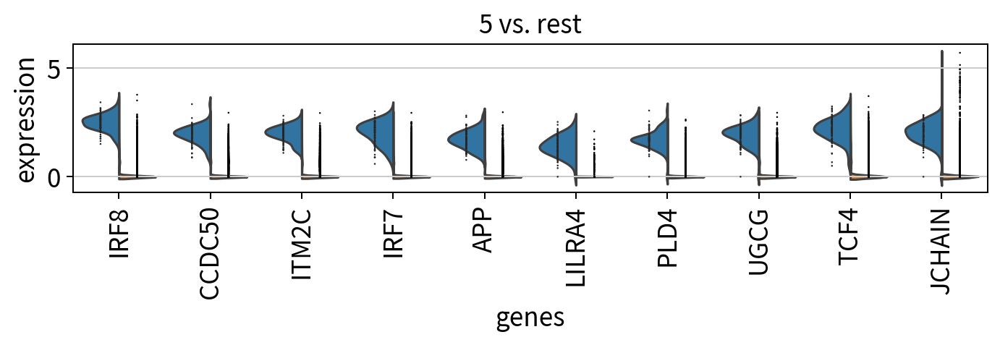

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


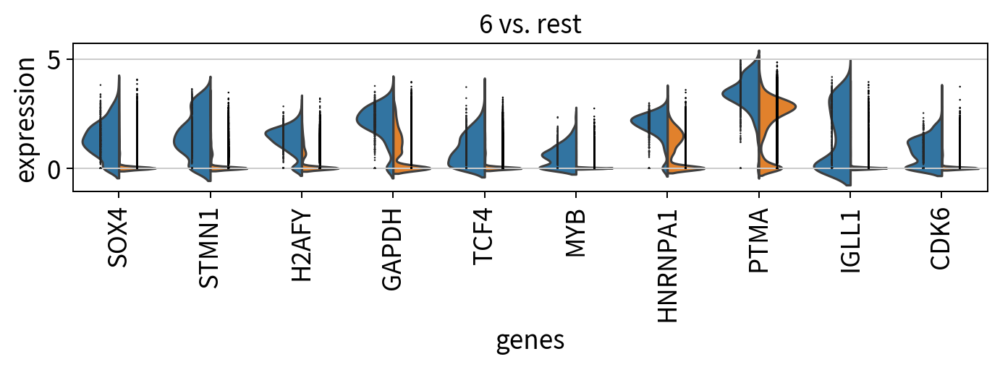

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


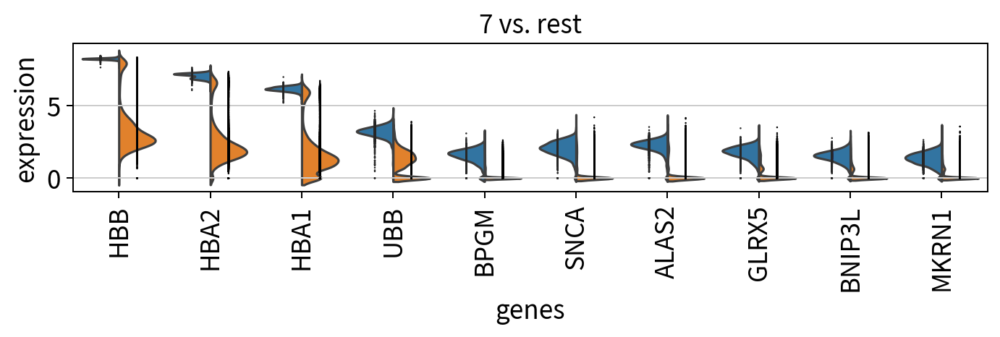

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


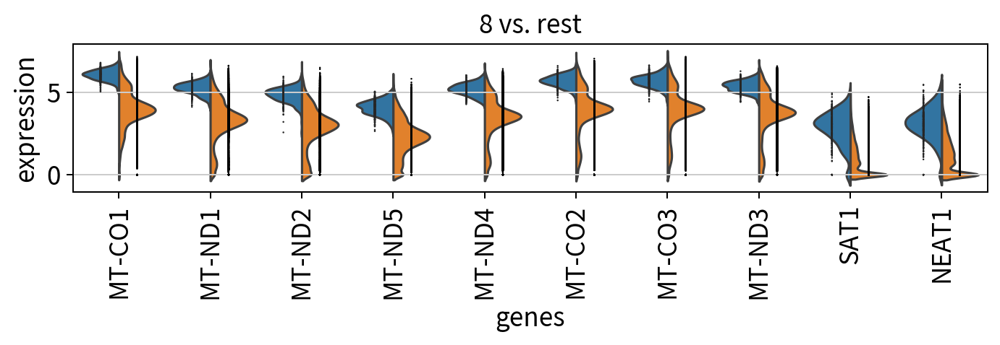

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


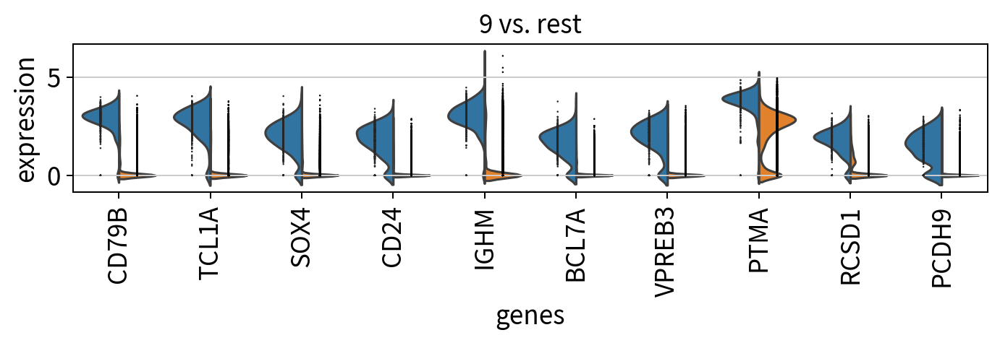

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


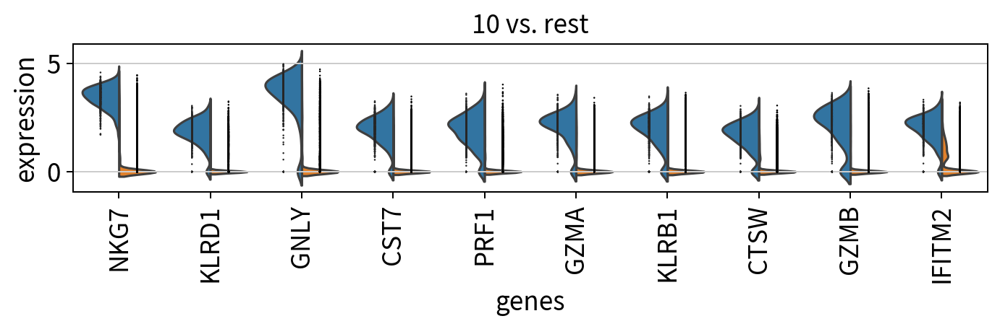

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


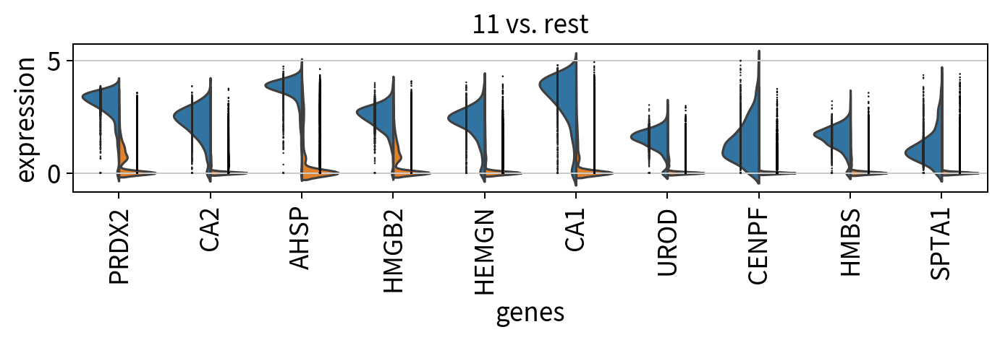

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


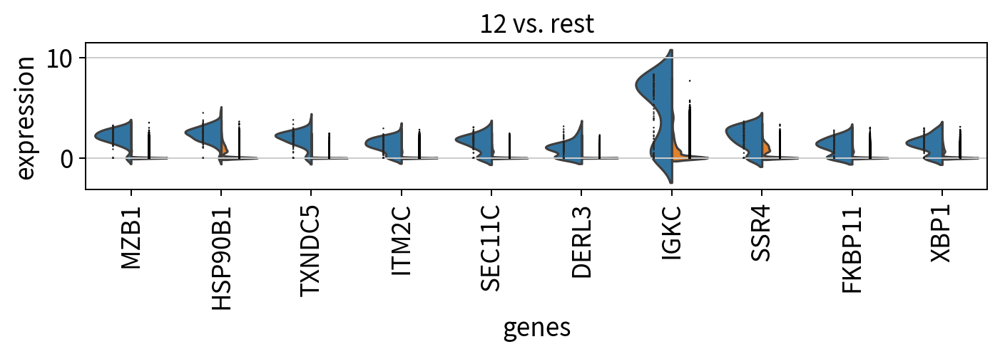

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


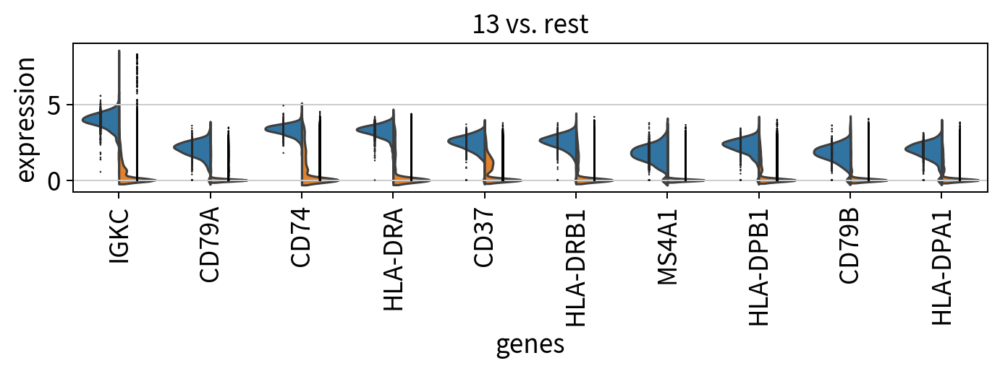

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


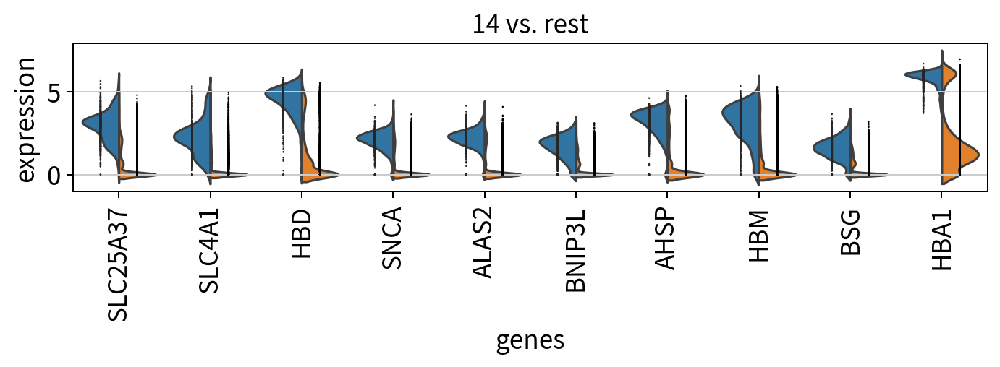

/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/.envs/sc_rna/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1328: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


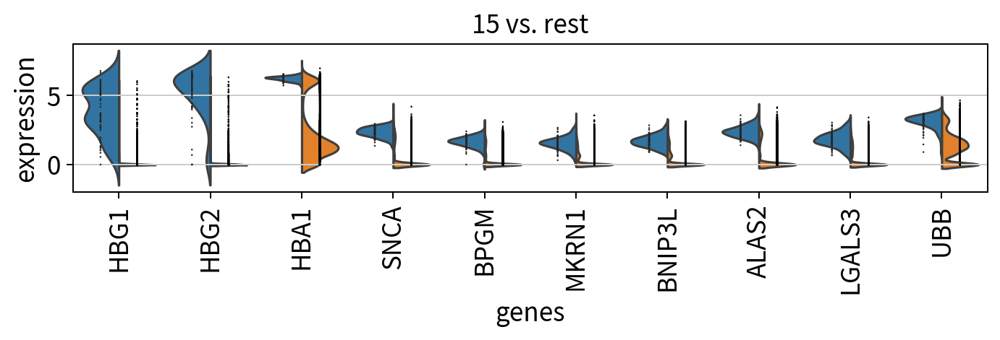

In [24]:
# 功能说明：使用分割小提琴图（Violin Plot）展示差异表达基因。
# 运行目的：概览每个聚类的前 10 个标记基因的表达分布。
# 变量/函数/参数解析：
# - sc.pl.rank_genes_groups_violin(...)：
#   - n_genes=10：每个聚类显示前 10 个基因。
#   - jitter=True：
#     - 在小提琴图上叠加抖动的散点。
#     - 可以展示实际的数据点分布，避免小提琴图掩盖样本量过少的问题。
with rc_context({"figure.figsize": (9, 1.5)}):
    sc.pl.rank_genes_groups_violin(adata, n_genes=10, jitter=False,key=leiden_res+"_rank_genes_groups", save="_10_265.pdf")

## 10.10 指定特定类群之间进行差异表达分析

In [25]:
# 使用较细聚类的一级谱系标签进行比较；粗聚类中的混合免疫群不作为纯 T/NK 参照。
# 功能说明：指定特定类群之间进行差异表达分析。
# 运行目的：比较两个特定的细胞类型（例如 B 细胞 vs T/NK/ILC 细胞），寻找它们之间的差异基因。
# 变量/函数/参数解析：
# - groupby="cell_type_res_0.50_lvl1"：
#   - 使用一级细胞类型注释作为分组。
# - groups=["B_cells"]：
#   - 目标组（实验组）：B 细胞。
# - reference="T_NK_ILCs"：
#   - 参考组（对照组）：T/NK/ILC 细胞。
#   - 默认是 "rest"（其余所有），这里指定了具体的对照组。
# - key_added="B_vs_T"：
#   - 将结果存储在 "B_vs_T" 键下，避免覆盖其他结果。

sc.tl.rank_genes_groups(
    adata,                    
    groupby="cell_type_res_0.50_lvl1", 
    method="wilcoxon", use_raw=False, layer="log1p", 
    groups=["B_cells"],
    reference="T_NK_ILCs",
    key_added="B_vs_T",      # 自定义结果存储键名
)

## 10.11 保存差异表达结果

若需自定义绘图或采用更自动化的流程，可使用 scanpy.get.rank_genes_groups_df 以便利的格式提取差异表达结果。

In [26]:
# 功能说明：提取差异表达分析结果为 DataFrame。
# 运行目的：将复杂的差异分析结果对象转换为易于阅读和处理的表格格式。
# 变量/函数/参数解析：
# - sc.get.rank_genes_groups_df(...)：
#   - adata：AnnData 对象。
#   - group=None：
#     - 提取所有分组的结果。
#     - 如果指定具体组名（如 "0"），则只提取该组的结果。
#   - key=leiden_res+"_rank_genes_groups"：
#     - 指定要提取的差异分析结果来源。

# - group 哪个分组（如scanpy.tl.rank_genes_groups()函数中groupby参数所定义）需要返回结果。可以指定为列表形式。若groups参数为None，则返回所有分组的结果。
a = sc.get.rank_genes_groups_df(adata, group=None,key=leiden_res+"_rank_genes_groups")
a

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,TPT1,86.244690,2.550848,0.000000e+00,0.000000e+00
1,0,RPL30,84.758156,2.892472,0.000000e+00,0.000000e+00
2,0,RPL34,84.731026,2.912660,0.000000e+00,0.000000e+00
3,0,RPS14,84.229195,2.802158,0.000000e+00,0.000000e+00
4,0,RPS15A,84.222115,2.795270,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...
374827,15,MT-ND4,-11.225738,-3.655653,3.048324e-29,4.200770e-26
374828,15,MT-ATP6,-11.277144,-3.778671,1.701810e-29,2.491768e-26
374829,15,MT-CO2,-11.395494,-3.777632,4.403276e-30,7.368253e-27
374830,15,MT-CYB,-11.418468,-4.072103,3.381391e-30,6.093527e-27


In [27]:
b = sc.get.rank_genes_groups_df(adata, group=None,key="B_vs_T")
b

,names,scores,logfoldchanges,pvals,pvals_adj
0,CD74,66.809868,5.025044,0.0,0.0
1,HLA-DRA,65.238335,6.674324,0.0,0.0
2,IGHM,61.096828,7.512362,0.0,0.0
3,CD79A,60.856087,6.936289,0.0,0.0
4,HLA-DRB1,59.929890,4.750025,0.0,0.0
...,...,...,...,...,...
23422,HCST,-56.530865,-3.877253,0.0,0.0
23423,BCL11B,-57.676868,-4.977124,0.0,0.0
23424,CD3E,-58.477070,-5.053000,0.0,0.0
23425,CD3D,-60.640175,-5.255466,0.0,0.0


In [28]:
# 功能说明：将差异分析结果保存为 CSV 文件。
# 运行目的：导出数据以便在 Excel 或其他工具中查看和分享。
# 变量/函数/参数解析：
# - a.to_csv(...)：
#   - Pandas DataFrame 的保存方法。
#   - 'de_result.csv'：文件名。
#   - encoding='utf-8-sig'：
#     - 使用带 BOM 的 UTF-8 编码。
#     - 这对于在 Windows 上的 Excel 中正确打开包含非 ASCII 字符（如中文）的文件非常重要。

ctx.table("markers_by_cluster", a, index=False)  # 支持中文的编码,, sep='\t'
ctx.table("b_vs_t_nk_ilc", b, index=False)  # 支持中文的编码,, sep='\t'

PosixPath('/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/results/10_differential_expression/20260915T075105_46d0d8/tables/b_vs_t_nk_ilc.csv')

当然也可以进行其他注释层次的分析

In [29]:
# 功能说明：执行差异表达分析（Differential Expression Analysis）。
# 运行目的：识别每个聚类（细胞类型）的特异性标记基因（Marker Genes），用于后续的生物学注释。
# 变量/函数/参数解析：
# - leiden_res = "leiden_res_0_50"：
#   - 定义要使用的聚类结果列名。
# - sc.tl.rank_genes_groups(...)：
#   - adata：AnnData 对象。
#   - groupby=leiden_res：指定分组变量，即按哪个聚类结果进行差异分析。
#   - method="wilcoxon"：
#     - 使用 Wilcoxon 秩和检验（非参数检验）。
#     - 相比 t 检验，它不假设数据服从正态分布，更适合单细胞数据的稀疏和偏态分布特性。
#   - key_added=leiden_res+"_rank_genes_groups"：
#     - 将分析结果存储在 adata.uns 中的指定键名下，避免覆盖默认的 'rank_genes_groups'。
#   - 默认行为：
#     - 对每个组进行 "One-vs-Rest"（该组 vs 其余所有组）比较。
#     - 计算 p 值、校正 p 值（benjamini-hochberg）、log2FC（对数倍数变化）等统计量。



# 4. 生物学意义：
#    - 识别每个聚类/细胞类型的特异性标记基因
#    - 用于细胞类型注释（找到每个细胞类型的特征基因）
#    - 发现不同条件下差异表达的基因

# 定义聚类分辨率变量
leiden_res = "cell_type_res_0.02_lvl1"
sc.tl.rank_genes_groups(
    adata,                    
    groupby=leiden_res, 
    method="wilcoxon", use_raw=False, layer="log1p",
    key_added=leiden_res+"_rank_genes_groups"
)
#保存结果
c = sc.get.rank_genes_groups_df(adata, group=None,key=leiden_res+"_rank_genes_groups")
c


,group,names,scores,logfoldchanges,pvals,pvals_adj
0,B_cells,CD74,69.901520,4.517494,0.000000e+00,0.000000e+00
1,B_cells,HLA-DRA,69.326057,5.070791,0.000000e+00,0.000000e+00
2,B_cells,IGHM,68.139603,6.675804,0.000000e+00,0.000000e+00
3,B_cells,CD37,66.616402,3.422663,0.000000e+00,0.000000e+00
4,B_cells,CD79A,65.884834,6.312191,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...
93703,Myeloid,BCL11B,-25.656147,-3.748606,3.610408e-145,1.346832e-143
93704,Myeloid,CD69,-27.715961,-2.933333,4.484044e-169,1.982032e-167
93705,Myeloid,ETS1,-28.993788,-3.471236,7.880090e-185,3.944591e-183
93706,Myeloid,MALAT1,-29.395674,-0.808633,6.237466e-190,3.283710e-188


In [30]:
ctx.table("markers_by_broad_type", c, index=False)  # 支持中文的编码,, sep='\t'

PosixPath('/data/home/heqingchuan/workdir/19_方超老师合作_单细胞_gpt6/sc_RNA/sc_RNA_basic_course/results/10_differential_expression/20260915T075105_46d0d8/tables/markers_by_broad_type.csv')

## 保存本章结果

保存表格、参数摘要和可供后续章节读取的数据。

In [31]:
ctx.table("markers_by_cluster", a, index=False)
ctx.table("b_vs_t_nk_ilc", b, index=False)
ctx.table("markers_by_broad_type", c, index=False)
filtered_key = "leiden_res_0_50_rank_genes_groups_filtered"
filtered = sc.get.rank_genes_groups_df(adata_filtered, group=None, key=filtered_key)
ctx.table("filtered_markers", filtered, index=False)
ctx.finish(adata, {"cluster_marker_rows": len(a), "b_vs_t_nk_ilc_rows": len(b), "broad_type_marker_rows": len(c), "method": "wilcoxon", "expression_layer": "log1p", "comparison_scope": "描述性标记探索；不代表有独立生物学重复的条件效应检验"})

本章计算完成。请阅读本次图表和表格，再更新本章解读。


## 结果阅读与思考

请打开本次结果目录中的 summary.json、tables 和 figures。将目的、方法、结果和解释写入本章报告源稿，再更新 Word。

思考题：统计显著、表达差异大和细胞类型特异性强，是同一件事吗？

运行与报告操作见课程根目录的 99_运行与AI协作指南.md。